# SH3 decomposition study — overview

Reads the per-run `results.json` files written by `scripts/sh3_decomposition_study.py`
(under `results/sh3_study/`) and

1. plots an **overview** comparing the two dataset variants
   (`blender_env_ground_shadow`, `ct-ct_sh-frOn_env_ground`) × the two optimizer setups
   (`lbfgs`, `varpro`) across reconstruction / albedo / roughness / metallic / lighting /
   relighting error;
2. visualizes **GT vs Recon** (training lights) and **Relight(Est) vs Relight(target=GT
   intrinsics)** (held-out reference lights) for a chosen scene;
3. renders and saves a **relighting animation** — a light at 45° elevation orbiting azimuth
   −45° → +45°.

> **Reading the plots.** `blender_env_ground_shadow` bakes cast shadows the shadow-free
> Cook–Torrance model cannot reproduce, so its `recon_rmse` is structurally higher — that
> is the data, not a broken decomposition. `faithful_relight_rmse` renders *both* GT and
> estimated intrinsics through identical, shadow-free geometry, so it is the fair
> cross-variant measure of intrinsic quality.

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import os, sys, json, math
from pathlib import Path
import numpy as np, torch, pandas as pd
import matplotlib.pyplot as plt

# Repo root, found by walking up from the CWD (notebook may be launched from notebooks/).
REPO = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "idr").is_dir())
os.chdir(REPO)
if str(REPO) not in sys.path: sys.path.insert(0, str(REPO))
os.environ.setdefault('WANDB_MODE', 'disabled')

from idr.data.scene_io import load_scene
from idr.eval.relight_sweep import Relighter, dir_sh, relight_sweep, _tonemap_fn, _write_video
from idr.paths import SH3_STUDY_DIR

RESULTS_ROOT = SH3_STUDY_DIR                 # results/sh3_study/
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('results root:', RESULTS_ROOT, '| device:', DEVICE)

results root: /home/felix/Projects/image-intrinsics/results/sh3_study | device: cuda


## 1. Load every run's `results.json` into a DataFrame

In [4]:
def load_study(root=RESULTS_ROOT):
    rows = []
    for p in sorted(Path(root).glob('*/results.json')):
        r = json.loads(p.read_text())
        row = dict(view=r['view'], variant=r['variant'], setup=r['setup'],
                   out_dir=r['out_dir'], scene_dir=r['scene_dir'], status=r.get('status'))
        row.update(r.get('metrics', {}))
        rows.append(row)
    df = pd.DataFrame(rows)
    if df.empty:
        raise SystemExit(f'no results.json under {root} — run scripts/sh3_decomposition_study.py first')
    return df

df = load_study()
print(f'{len(df)} run(s), {df.view.nunique()} view(s)')
df.groupby(['variant','setup']).size()

256 run(s), 65 view(s)


variant                    setup 
blender_env_ground_shadow  lbfgs     62
                           varpro    65
ct-ct_sh-frOn_env_ground   lbfgs     64
                           varpro    65
dtype: int64

## 2. Overview — variant × setup across every metric

Bars are the mean over views; the error bar is ±1 std across views.

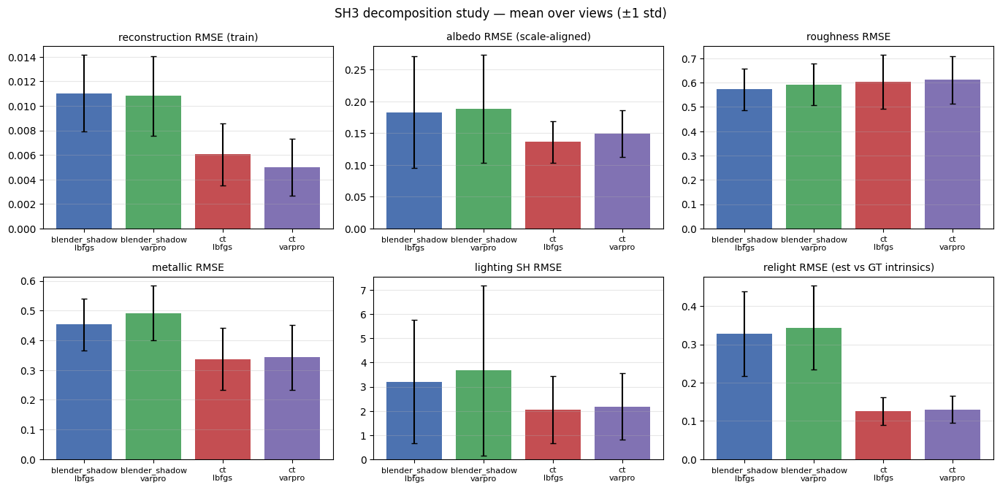

In [5]:
OVERVIEW_METRICS = [
    ('recon_rmse',            'reconstruction RMSE (train)'),
    ('albedo_rmse',           'albedo RMSE (scale-aligned)'),
    ('roughness_rmse',        'roughness RMSE'),
    ('metallic_rmse',         'metallic RMSE'),
    ('lighting_sh_rmse',      'lighting SH RMSE'),
    ('faithful_relight_rmse', 'relight RMSE (est vs GT intrinsics)'),
]

def overview_plot(df, metrics=OVERVIEW_METRICS):
    variants = sorted(df.variant.unique())
    setups   = sorted(df.setup.unique())
    groups   = [(v, s) for v in variants for s in setups]
    labels   = [f'{v.replace("_env_ground","").replace("ct-ct_sh-frOn","ct")}\n{s}' for v, s in groups]
    x = np.arange(len(groups))
    ncol = 3; nrow = int(np.ceil(len(metrics)/ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(4.6*ncol, 3.4*nrow), squeeze=False)
    for ax, (key, title) in zip(axes.ravel(), metrics):
        if key not in df:
            ax.set_visible(False); continue
        means = [df[(df.variant==v)&(df.setup==s)][key].mean() for v, s in groups]
        stds  = [df[(df.variant==v)&(df.setup==s)][key].std()  for v, s in groups]
        colors = ['#4C72B0','#55A868','#C44E52','#8172B3'][:len(groups)]
        ax.bar(x, means, yerr=stds, capsize=3, color=colors)
        ax.set_xticks(x); ax.set_xticklabels(labels, fontsize=8)
        ax.set_title(title, fontsize=10); ax.grid(axis='y', alpha=0.3)
    for ax in axes.ravel()[len(metrics):]:
        ax.set_visible(False)
    fig.suptitle('SH3 decomposition study — mean over views (±1 std)', fontsize=12)
    plt.tight_layout(); plt.show()

overview_plot(df)

In [6]:
# The same numbers as a table.
tbl_cols = [k for k,_ in OVERVIEW_METRICS if k in df]
df.groupby(['variant','setup'])[tbl_cols].mean().round(4)

recon_rmse  albedo_rmse  roughness_rmse  \
variant                   setup                                             
blender_env_ground_shadow lbfgs       0.0110       0.1829          0.5725   
                          varpro      0.0108       0.1882          0.5929   
ct-ct_sh-frOn_env_ground  lbfgs       0.0060       0.1360          0.6037   
                          varpro      0.0050       0.1491          0.6112   

                                  metallic_rmse  lighting_sh_rmse  \
variant                   setup                                     
blender_env_ground_shadow lbfgs          0.4531            3.2117   
                          varpro         0.4917            3.6663   
ct-ct_sh-frOn_env_ground  lbfgs          0.3361            2.0402   
                          varpro         0.3424            2.1809   

                                  faithful_relight_rmse  
variant                   setup                          
blender_env_ground_shadow lbfgs                  0.3276  
                          varpro                 0.3436  
ct-ct_sh-frOn_env_ground  lbfgs                  0.1250  
                          varpro                 0.1301

## 2b. Relight RMSE per view — `blender_env_ground_shadow` (sorted descending)

The faithful relight RMSE (est vs GT intrinsics) for every view of the blender-shadow
variant, worst first — so the hardest scenes for each optimizer are at the top.

In [7]:
def blender_shadow_relight_table(df, variant='blender_env_ground_shadow',
                                 metric='faithful_relight_rmse'):
    sub = df[df.variant == variant]
    if sub.empty:
        raise SystemExit(f'no {variant} runs loaded yet')
    tbl = sub.pivot_table(index='view', columns='setup', values=metric)
    tbl['mean'] = tbl.mean(axis=1)
    return tbl.sort_values('mean', ascending=False)

relight_tbl = blender_shadow_relight_table(df)
relight_tbl.round(4)

setup,lbfgs,varpro,mean
view,,,
6cd50522_v2,0.8632,0.8702,0.8667
6cd50522_v1,0.7220,0.7488,0.7354
6cd50522_v0,0.6228,0.6690,0.6459
6cd50522_v3,0.4570,0.4825,0.4697
8c489604_v2,0.4672,0.4530,0.4601
...,...,...,...
1f19c3ef_v4,0.2400,0.2555,0.2477
887b2099_v0,0.2408,0.2447,0.2427
e534fb8b_v3,0.2352,0.2407,0.2379


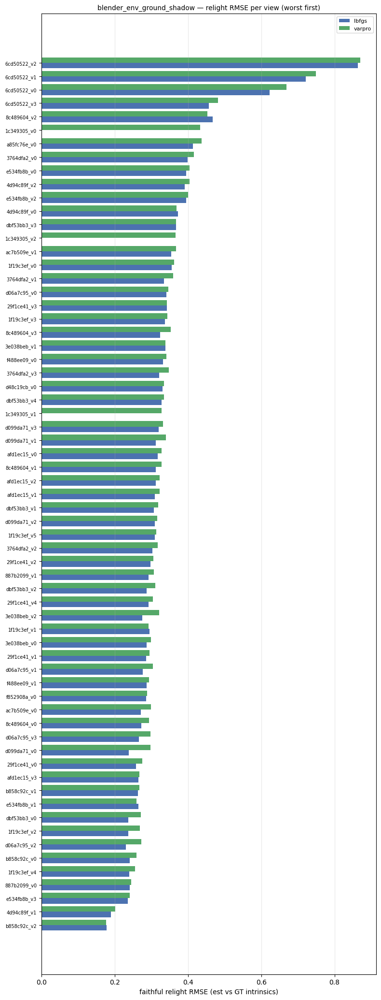

In [8]:
# Horizontal bar chart, worst view at the top.
def plot_blender_shadow_relight(tbl):
    setups = [c for c in tbl.columns if c != 'mean']
    order  = tbl.index[::-1]                              # invert_yaxis puts worst on top
    y = np.arange(len(order)); h = 0.8/max(len(setups),1)
    colors = {'lbfgs':'#4C72B0','varpro':'#55A868'}
    fig, ax = plt.subplots(figsize=(8, max(3, 0.32*len(order))))
    for i, s in enumerate(setups):
        ax.barh(y + i*h, tbl.loc[order, s].values, height=h,
                label=s, color=colors.get(s, None))
    ax.set_yticks(y + h*(len(setups)-1)/2); ax.set_yticklabels(order, fontsize=7)
    ax.set_xlabel('faithful relight RMSE (est vs GT intrinsics)')
    ax.set_title('blender_env_ground_shadow — relight RMSE per view (worst first)', fontsize=10)
    ax.legend(fontsize=8); ax.grid(axis='x', alpha=0.3)
    plt.tight_layout(); plt.show()

plot_blender_shadow_relight(relight_tbl)

## 3. Pick a scene to inspect

Set `VIEW`, `VARIANT`, `SETUP` to one of the runs above.

In [21]:
#VIEW    = df.view.iloc[0]
VIEW    = "6cd50522_v2" # worst
VIEW    = "b858c92c_v2" # best
VARIANT = 'ct-ct_sh-frOn_env_ground'
SETUP   = 'varpro'

def pick_run(view, variant, setup, df=df):
    hit = df[(df.view==view)&(df.variant==variant)&(df.setup==setup)]
    if hit.empty:
        raise SystemExit(f'no run for {view}/{variant}/{setup}')
    r = hit.iloc[0]
    return Path(r.out_dir), Path(r.scene_dir)

RUN_DIR, SCENE_DIR = pick_run(VIEW, VARIANT, SETUP)
sc = load_scene(SCENE_DIR, gt_npy=True)
mask = sc['mask_np']
gt_intr  = dict(albedo=sc['albedo_np'], metallic=sc['metallic_np'], roughness=sc['roughness_np'])
est_intr = dict(albedo=np.load(RUN_DIR/'albedo_scaled.npy'),
                metallic=np.load(RUN_DIR/'metallic_est.npy'),
                roughness=np.load(RUN_DIR/'roughness_est.npy'))
print('run  :', RUN_DIR.name)
print('scene:', SCENE_DIR)

run  : b858c92c_v2__ct-ct_sh-frOn_env_ground__varpro
scene: /home/felix/Projects/image-intrinsics/local_datasets/26-08-09-datasets/sh3/b858c92c_v2/ct-ct_sh-frOn_env_ground


## 4. GT vs Recon (training lights)

The observed input image vs `decompose_scene`'s saved reconstruction, for a few training
lights, with the per-pixel error map.

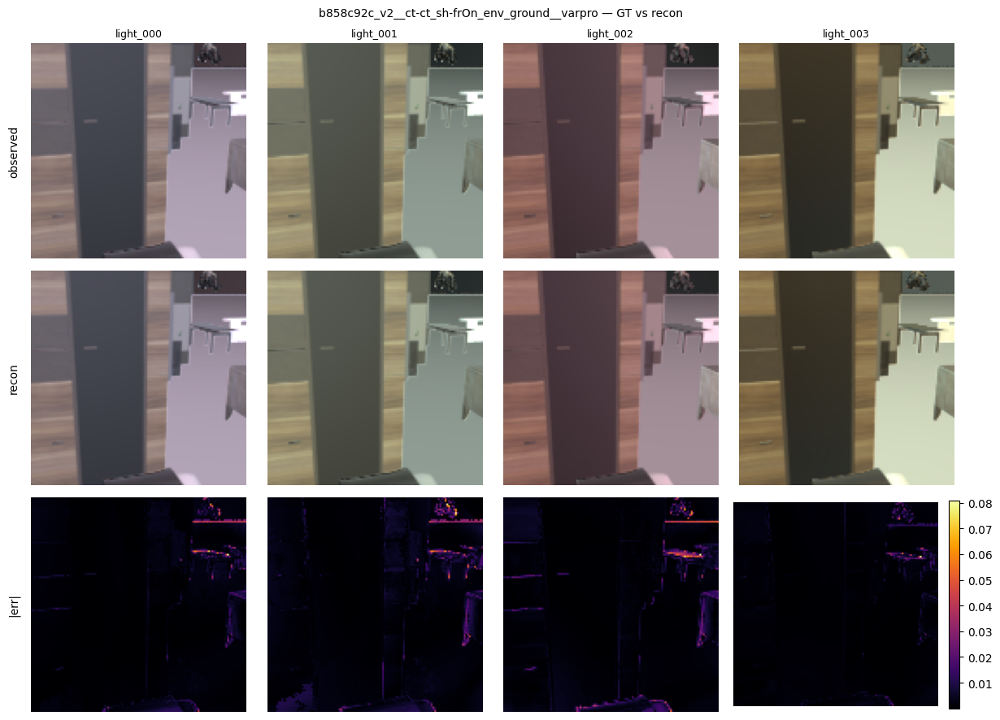

In [22]:
def show_gt_vs_recon(run_dir, scene_dir, n=4):
    recon_paths = sorted((run_dir/'reconstructions').glob('recon_*.npy'))[:n]
    tm = _tonemap_fn([np.load(p) for p in recon_paths]) if recon_paths else (lambda x: x)
    fig, axes = plt.subplots(3, len(recon_paths), figsize=(3.1*len(recon_paths), 9), squeeze=False)
    for c, rp in enumerate(recon_paths):
        key = rp.stem.replace('recon_', '')                 # e.g. light_000
        recon = np.load(rp)
        obs   = np.load(scene_dir/f'{key}.npy')
        err   = np.abs(obs - recon).mean(-1) * mask
        for r,(im,t,cm) in enumerate([(tm(obs),'observed',None),(tm(recon),'recon',None),
                                       (err,'|err|','inferno')]):
            a = axes[r][c]; h = a.imshow(im, cmap=cm); a.axis('off')
            if r==0: a.set_title(key, fontsize=9)
            if c==0: a.text(-0.08,0.5,t,transform=a.transAxes,rotation=90,va='center',ha='center')
            if cm and c==len(recon_paths)-1: plt.colorbar(h, ax=a, fraction=0.046)
    fig.suptitle(f'{run_dir.name} — GT vs recon', fontsize=10); plt.tight_layout(); plt.show()

show_gt_vs_recon(RUN_DIR, SCENE_DIR)

## 5. Relight(Est) vs Relight(target = GT intrinsics)

For a few of the 16 held-out **reference** SH lights, render the estimated intrinsics and
the GT intrinsics through identical geometry and compare. This is the `faithful_relight_rmse`
metric, made visual.

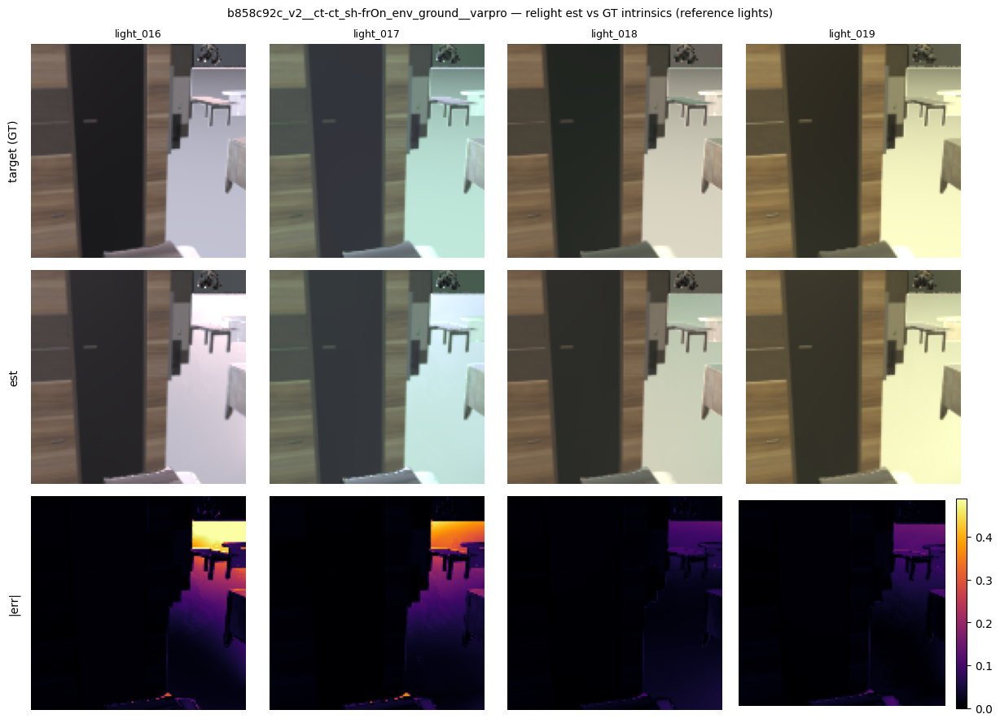

In [23]:
def show_relight_est_vs_target(run_dir, scene_dir, n=4, n_train=16, n_relight=16):
    rel = Relighter(sc['normals_np'], mask, device=DEVICE, dtype=torch.float32)
    gt_sh = sc['sh_coeffs']
    idx = list(range(n_train, n_train+n_relight))[:n]
    gt_f  = [rel.render(gt_intr,  gt_sh[i]) for i in idx]
    est_f = [rel.render(est_intr, gt_sh[i]) for i in idx]
    tm = _tonemap_fn(gt_f)
    errs = [np.abs(g-e).mean(-1) for g,e in zip(gt_f, est_f)]
    emax = float(np.percentile(np.stack(errs), 99.5)) or 1.0
    fig, axes = plt.subplots(3, len(idx), figsize=(3.1*len(idx), 9), squeeze=False)
    for c,i in enumerate(idx):
        for r,(im,t,cm) in enumerate([(tm(gt_f[c]),'target (GT)',None),
                                      (tm(est_f[c]),'est',None),
                                      (errs[c],'|err|','inferno')]):
            a = axes[r][c]; h = a.imshow(im, cmap=cm, vmin=0 if cm else None,
                                         vmax=emax if cm else None); a.axis('off')
            if r==0: a.set_title(sc['light_keys'][i], fontsize=9)
            if c==0: a.text(-0.08,0.5,t,transform=a.transAxes,rotation=90,va='center',ha='center')
            if cm and c==len(idx)-1: plt.colorbar(h, ax=a, fraction=0.046)
    fig.suptitle(f'{run_dir.name} — relight est vs GT intrinsics (reference lights)', fontsize=10)
    plt.tight_layout(); plt.show()
    del rel

show_relight_est_vs_target(RUN_DIR, SCENE_DIR)

## 6. Relighting animation — light at 45° elevation, azimuth −45° → +45°

`relight_sweep` writes `compare.(mp4|gif)` (GT | EST | |err|) and `est.(mp4|gif)` into
`<run>/relight_sweep/`. mp4 needs `imageio-ffmpeg`; otherwise it falls back to an animated
GIF. Re-run with a different `RUN_DIR`/`SCENE_DIR` to animate another scene.

In [24]:
res = relight_sweep(RUN_DIR, SCENE_DIR, downsample=1,
                    az_from=-45.0, az_to=45.0, elev=45.0, n_frames=61,
                    video=True, plots=True, device=DEVICE)
video_path = Path(res.get('video', ''))
print('wrote:', video_path)
print('mean relight RMSE across sweep (scaled albedo):', round(res['sweep_rmse_scaled'], 4))

wrote: /home/felix/Projects/image-intrinsics/results/sh3_study/b858c92c_v2__ct-ct_sh-frOn_env_ground__varpro/relight_sweep/compare.gif
mean relight RMSE across sweep (scaled albedo): 0.024


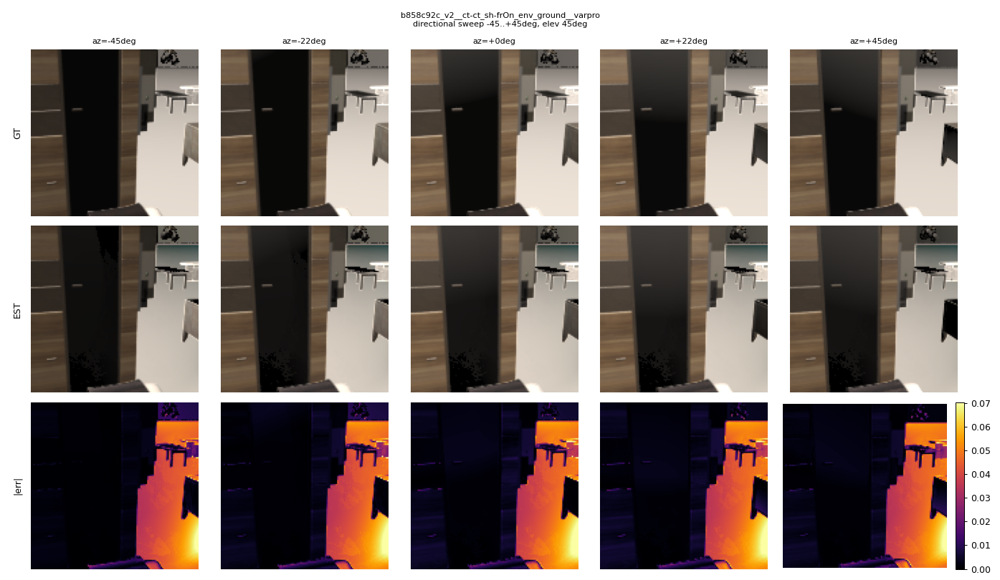

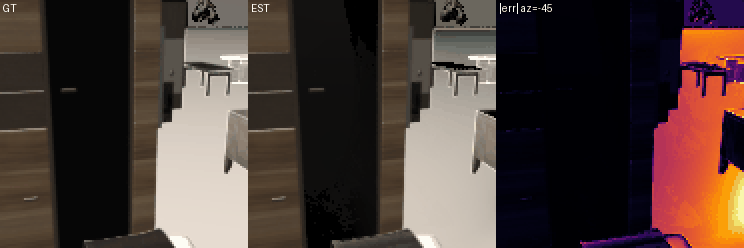

In [25]:
# Display the sweep panels + the video inline.
from IPython.display import Video, Image as IPyImage, display
panels = RUN_DIR/'relight_sweep'/'sweep_panels.png'
if panels.exists(): display(IPyImage(filename=str(panels)))
if video_path.suffix == '.mp4' and video_path.exists():
    display(Video(str(video_path), embed=True, width=720))
elif video_path.suffix == '.gif' and video_path.exists():
    display(IPyImage(filename=str(video_path)))